In [1]:
#!pip install --pre pycaret
#!pip install pycaret

In [2]:
#!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

In [3]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-c01e9ec8-98ae-62be-3e0d-c43b839eca4e)


In [2]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import keras
from pandas_profiling import ProfileReport

ModuleNotFoundError: No module named 'pandas_profiling'

In [5]:
from helper_functions import *
from plotingfun import *

In [6]:
data = pd.read_csv('/content/diabetes.csv') 

In [7]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [1]:
profile = ProfileReport(data, title="Diabetes Data", html={"style":{"full_width":True}})

NameError: name 'ProfileReport' is not defined

In [9]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
profile.to_file("output.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
data["Glucose"].mean()

120.89453125

In [12]:
data["Glucose"].median()

117.0

In [13]:
data.loc[data["Glucose"] == 0, "Glucose"] = data["Glucose"].mean()

In [14]:
data["BloodPressure"].mean()

69.10546875

In [15]:
data["BloodPressure"].median()

72.0

In [16]:
data.loc[data["BloodPressure"] == 0, "BloodPressure"] = data["BloodPressure"].median()

In [17]:
data["SkinThickness"].mean()

20.536458333333332

In [18]:
data["SkinThickness"].median()

23.0

In [19]:
data.loc[data["SkinThickness"] == 0, "SkinThickness"] = data["SkinThickness"].mean()

In [20]:
data["Insulin"].mean()

79.79947916666667

In [21]:
data["Insulin"].median()

30.5

In [22]:
data.loc[data["Insulin"] == 0, "Insulin"] = data["Insulin"].mean()

In [23]:
data["BMI"].mean()

31.992578124999998

In [24]:
data["BMI"].median()

32.0

In [25]:
data.loc[data["BMI"] == 0, "BMI"] = data["BMI"].median()

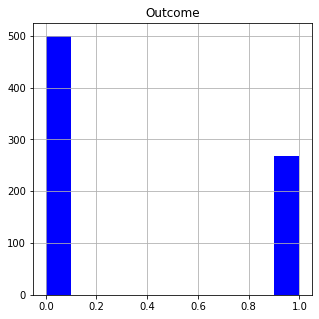

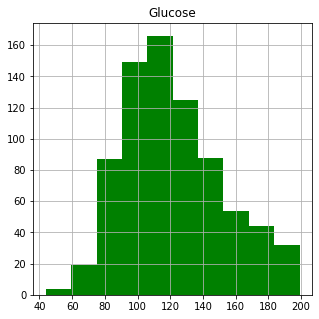

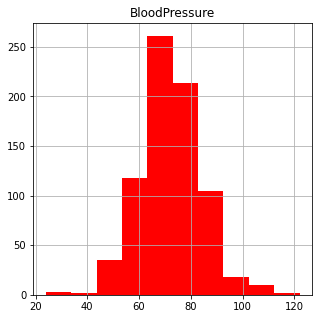

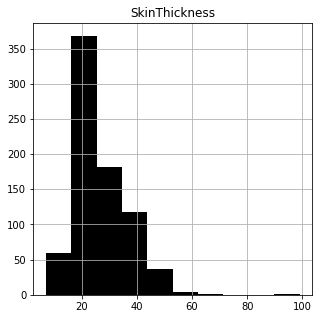

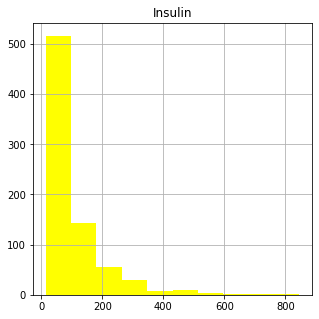

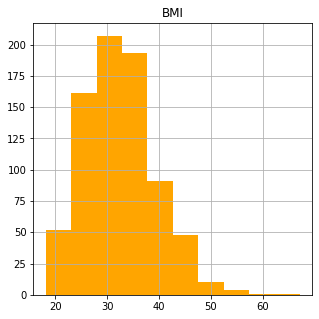

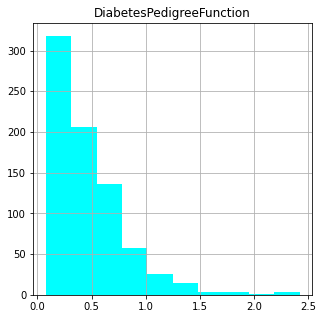

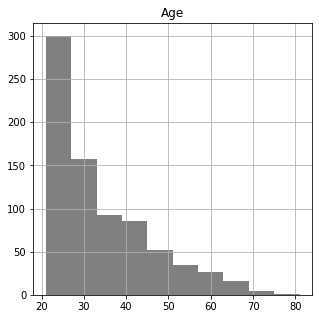

In [26]:
data['Outcome'].hist(figsize=(5,5),color="blue")
plt.title("Outcome")
plt.show()
data['Glucose'].hist(figsize=(5,5),color="green")
plt.title("Glucose")
plt.show()
data['BloodPressure'].hist(figsize=(5,5),color="red")
plt.title("BloodPressure")
plt.show()
data['SkinThickness'].hist(figsize=(5,5),color="black")
plt.title("SkinThickness")
plt.show()
data['Insulin'].hist(figsize=(5,5),color="yellow")
plt.title("Insulin")
plt.show()
data['BMI'].hist(figsize=(5,5),color="orange")
plt.title("BMI")
plt.show()
data['DiabetesPedigreeFunction'].hist(figsize=(5,5),color="cyan")
plt.title("DiabetesPedigreeFunction")
plt.show()
data['Age'].hist(figsize=(5,5),color="grey")
plt.title("Age")
plt.show()

In [27]:
X=data.dropna().drop("Outcome",axis=1)

In [28]:
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60,20.536458,79.799479,30.1,0.349,47


In [29]:
y=data["Outcome"]

In [30]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [31]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)

In [32]:
len(X_train), len(X_test), len(y_train), len(y_test)

(614, 154, 614, 154)

In [33]:
X_train, X_test, y_train, y_test

(     Pregnancies  Glucose  BloodPressure  SkinThickness     Insulin   BMI  \
 60             2     84.0             72      20.536458   79.799479  32.0   
 618            9    112.0             82      24.000000   79.799479  28.2   
 346            1    139.0             46      19.000000   83.000000  28.7   
 294            0    161.0             50      20.536458   79.799479  21.9   
 231            6    134.0             80      37.000000  370.000000  46.2   
 ..           ...      ...            ...            ...         ...   ...   
 71             5    139.0             64      35.000000  140.000000  28.6   
 106            1     96.0            122      20.536458   79.799479  22.4   
 270           10    101.0             86      37.000000   79.799479  45.6   
 435            0    141.0             72      20.536458   79.799479  42.4   
 102            0    125.0             96      20.536458   79.799479  22.5   
 
      DiabetesPedigreeFunction  Age  
 60                     

In [34]:
import os

# Create a function to implement a ModelCheckpoint callback with a specific filename 
def create_model_checkpoint(model_name, save_path="model_experiments"):
  return tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(save_path, model_name), # create filepath to save model
                                            verbose=0, # only output a limited amount of text
                                            save_best_only=True) # save only the best model to file

In [35]:
training_data_0 = pd.concat([X_train, y_train], axis=1, join='inner')


In [36]:
training_data_0

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
60,2,84.0,72,20.536458,79.799479,32.0,0.304,21,0
618,9,112.0,82,24.000000,79.799479,28.2,1.282,50,1
346,1,139.0,46,19.000000,83.000000,28.7,0.654,22,0
294,0,161.0,50,20.536458,79.799479,21.9,0.254,65,0
231,6,134.0,80,37.000000,370.000000,46.2,0.238,46,1
...,...,...,...,...,...,...,...,...,...
71,5,139.0,64,35.000000,140.000000,28.6,0.411,26,0
106,1,96.0,122,20.536458,79.799479,22.4,0.207,27,0
270,10,101.0,86,37.000000,79.799479,45.6,1.136,38,1
435,0,141.0,72,20.536458,79.799479,42.4,0.205,29,1


***Model 0 PyCaret***

In [37]:
from pycaret.classification import *
model0 = setup(training_data_0, target ='Outcome')

,Description,Value
0,Session id,3185
1,Target,Outcome
2,Target type,Binary
3,Original data shape,"(614, 9)"
4,Transformed data shape,"(614, 9)"
5,Transformed train set shape,"(429, 9)"
6,Transformed test set shape,"(185, 9)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,simple


In [38]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.7625,0.8176,0.6252,0.6777,0.6437,0.4677,0.4736,0.1030
lr,Logistic Regression,0.7624,0.8373,0.5567,0.7255,0.6181,0.4510,0.4670,0.3230
ridge,Ridge Classifier,0.7578,0.0000,0.5367,0.7232,0.6048,0.4367,0.4537,0.0250
lda,Linear Discriminant Analysis,0.7578,0.8378,0.5367,0.7232,0.6048,0.4367,0.4537,0.0320
rf,Random Forest Classifier,0.7576,0.8235,0.5905,0.6851,0.6253,0.4492,0.4583,0.2570
et,Extra Trees Classifier,0.7576,0.8250,0.5571,0.6840,0.6056,0.4369,0.4458,0.2450
qda,Quadratic Discriminant Analysis,0.7507,0.8109,0.5705,0.6771,0.6108,0.4311,0.4396,0.0310
ada,Ada Boost Classifier,0.7390,0.7934,0.5976,0.6392,0.6115,0.4170,0.4217,0.1030
nb,Naive Bayes,0.7367,0.8001,0.5576,0.6458,0.5879,0.3991,0.4074,0.0320
lightgbm,Light Gradient Boosting Machine,0.7251,0.7969,0.5981,0.6022,0.5962,0.3892,0.3916,0.1350


Processing:   0%|          | 0/61 [00:00<?, ?it/s]

In [39]:
print(best)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=3185, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


In [40]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [41]:
predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.7622,0.8350,0.7500,0.6316,0.6857,0.4967,0.5014


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,prediction_label,prediction_score
429,0.0,95.0,64.0,39.0,105.000000,44.599998,0.366,22.0,0,0,0.9635
430,5.0,88.0,78.0,30.0,79.799477,27.600000,0.258,37.0,0,0,0.9196
431,0.0,180.0,66.0,39.0,79.799477,42.000000,1.893,25.0,1,1,0.9283
432,10.0,125.0,70.0,26.0,115.000000,31.100000,0.205,41.0,1,0,0.6281
433,6.0,80.0,80.0,36.0,79.799477,39.799999,0.177,28.0,0,0,0.9681
...,...,...,...,...,...,...,...,...,...,...,...
609,2.0,82.0,52.0,22.0,115.000000,28.500000,1.699,25.0,0,0,0.8832
610,6.0,151.0,62.0,31.0,120.000000,35.500000,0.692,28.0,0,1,0.9020
611,4.0,144.0,58.0,28.0,140.000000,29.500000,0.287,37.0,0,0,0.7001
612,1.0,97.0,70.0,15.0,79.799477,18.200001,0.147,21.0,0,0,0.9903


In [42]:
predictions = predict_model(best, data=X_test)
predictions

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,prediction_label,prediction_score
0,6.0,98.0,58.0,33.000000,190.000000,34.000000,0.430,43.0,1,0.8881
1,2.0,112.0,75.0,32.000000,79.799477,35.700001,0.148,21.0,0,0.7241
2,2.0,108.0,64.0,20.536459,79.799477,30.799999,0.158,21.0,0,0.8468
3,8.0,107.0,80.0,20.536459,79.799477,24.600000,0.856,34.0,0,0.8377
4,7.0,136.0,90.0,20.536459,79.799477,29.900000,0.210,50.0,1,0.5261
...,...,...,...,...,...,...,...,...,...,...
149,9.0,165.0,88.0,20.536459,79.799477,30.400000,0.302,49.0,1,0.7036
150,1.0,77.0,56.0,30.000000,56.000000,33.299999,1.251,24.0,0,0.8695
151,8.0,95.0,72.0,20.536459,79.799477,36.799999,0.485,57.0,0,0.6011
152,2.0,146.0,70.0,38.000000,360.000000,28.000000,0.337,29.0,0,0.8454


In [43]:
preds0=predictions["prediction_label"]

In [44]:
preds0

0      1
1      0
2      0
3      0
4      1
      ..
149    1
150    0
151    0
152    0
153    0
Name: prediction_label, Length: 154, dtype: int64

In [45]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_true=y_test, y_pred=preds0)

array([[72, 27],
       [17, 38]])

In [46]:
from sklearn.metrics import accuracy_score
model0_score=accuracy_score(y_true=y_test, y_pred=preds0)*100
model0_score

71.42857142857143

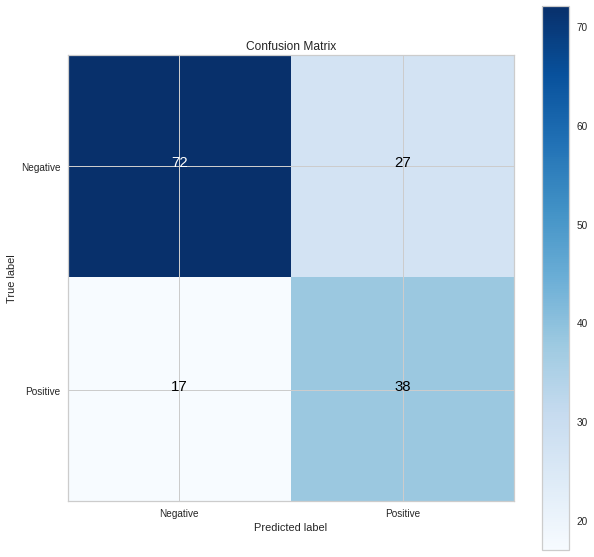

In [47]:
make_confusion_matrix(y_true=y_test, y_pred=preds0, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

***Model 1 LinearSVC***

In [48]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline


model1 = make_pipeline(StandardScaler(),
                    LinearSVC(verbose=1))

In [49]:
model1.fit(X_train,y_train)

[LibLinear]

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('linearsvc',
                 LinearSVC(C=1.0, class_weight=None, dual=True,
                           fit_intercept=True, intercept_scaling=1,
                           loss='squared_hinge', max_iter=1000,
                           multi_class='ovr', penalty='l2', random_state=None,
                           tol=0.0001, verbose=1))],
         verbose=False)

In [50]:
preds1=model1.predict(X_test)

In [51]:
preds1

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [52]:
from sklearn.metrics import accuracy_score
model1_score=accuracy_score(y_true=y_test, y_pred=preds1)*100
model1_score

76.62337662337663

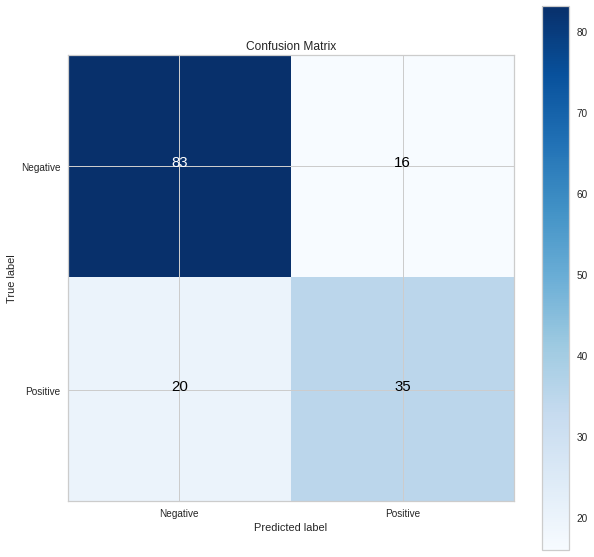

In [53]:
make_confusion_matrix(y_true=y_test, y_pred=preds1, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

***Model 2 SGD Classifier***

In [54]:
from sklearn.linear_model import SGDClassifier

model2 = make_pipeline(StandardScaler(),
                    SGDClassifier())


In [55]:
model2.fit(X_train,y_train)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('sgdclassifier',
                 SGDClassifier(alpha=0.0001, average=False, class_weight=None,
                               early_stopping=False, epsilon=0.1, eta0=0.0,
                               fit_intercept=True, l1_ratio=0.15,
                               learning_rate='optimal', loss='hinge',
                               max_iter=1000, n_iter_no_change=5, n_jobs=None,
                               penalty='l2', power_t=0.5, random_state=None,
                               shuffle=True, tol=0.001, validation_fraction=0.1,
                               verbose=0, warm_start=False))],
         verbose=False)

In [56]:
preds2=model2.predict(X_test)

In [57]:
preds2

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [58]:
from sklearn.metrics import accuracy_score
model2_score=accuracy_score(y_true=y_test, y_pred=preds2)*100
model2_score

72.07792207792207

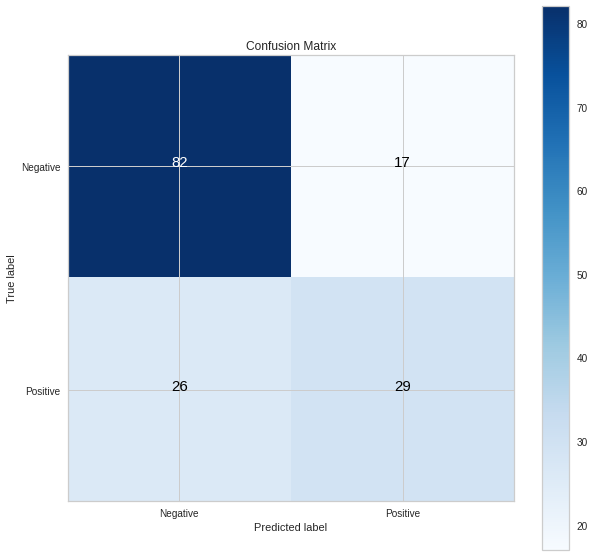

In [59]:
make_confusion_matrix(y_true=y_test, y_pred=preds2, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

***Model 3 Random Forest Classifier	***

In [60]:
from sklearn.ensemble import RandomForestClassifier

model3 = make_pipeline(RandomForestClassifier()
                    )


In [61]:
model3

Pipeline(memory=None,
         steps=[('randomforestclassifier',
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_samples_leaf=1, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=100, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=0, warm_start=False))],
         verbose=False)

In [62]:
model3.fit(X_train,y_train)

Pipeline(memory=None,
         steps=[('randomforestclassifier',
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_samples_leaf=1, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=100, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=0, warm_start=False))],
         verbose=False)

In [63]:
preds3=model3.predict(X_test)

In [64]:
preds3

array([1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [65]:
from sklearn.metrics import accuracy_score
model3_score=(accuracy_score(y_true=y_test, y_pred=preds3)*100)
model3_score

74.02597402597402

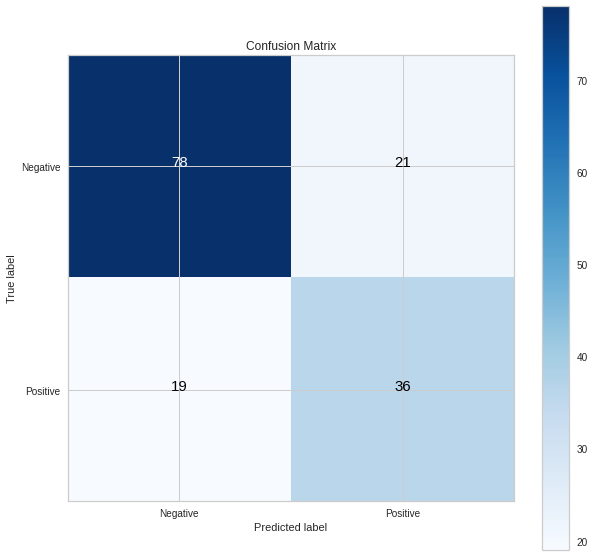

In [66]:
make_confusion_matrix(y_true=y_test, y_pred=preds3, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

***Model 4 Naive Bayes***

69.48051948051948


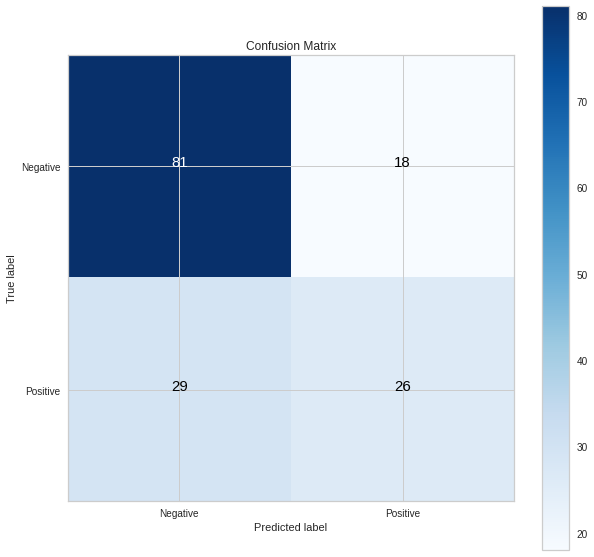

In [67]:
from sklearn.naive_bayes import MultinomialNB
model4_1=make_pipeline(
    MultinomialNB()
)
model4_1.fit(X_train,y_train)
preds4_1=model4_1.predict(X_test)
model4_1_score=accuracy_score(y_true=y_test, y_pred=preds4_1)*100
print(model4_1_score)
make_confusion_matrix(y_true=y_test, y_pred=preds4_1, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

75.32467532467533


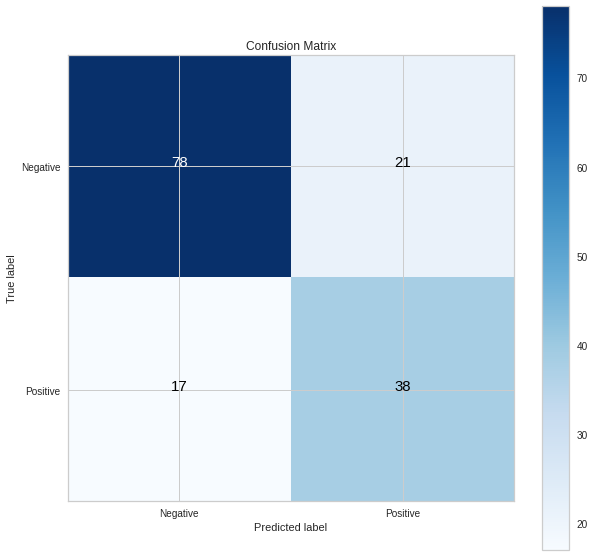

In [68]:
from sklearn.naive_bayes import GaussianNB
model4_2=make_pipeline(
    GaussianNB()
)
model4_2.fit(X_train,y_train)
preds4_2=model4_2.predict(X_test)
model4_2_score=accuracy_score(y_true=y_test, y_pred=preds4_2)*100
print(model4_2_score)
make_confusion_matrix(y_true=y_test, y_pred=preds4_2, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

68.18181818181817


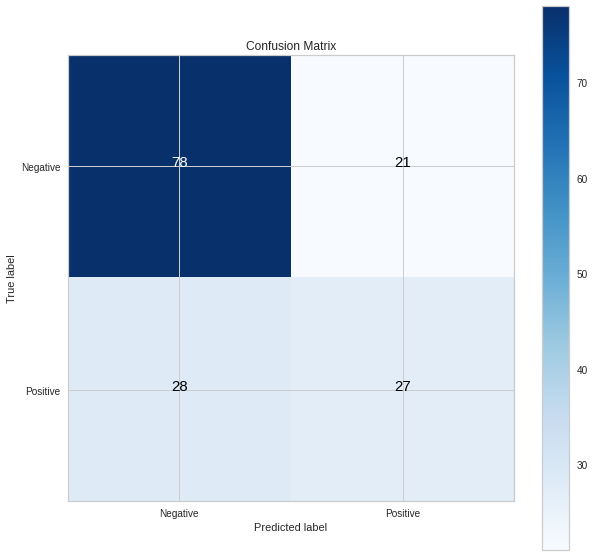

In [69]:
from sklearn.naive_bayes import ComplementNB
model4_3=make_pipeline(
    ComplementNB()
)
model4_3.fit(X_train,y_train)
preds4_3=model4_3.predict(X_test)
model4_3_score=accuracy_score(y_true=y_test, y_pred=preds4_3)*100
print(model4_3_score)
make_confusion_matrix(y_true=y_test, y_pred=preds4_3, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

64.28571428571429


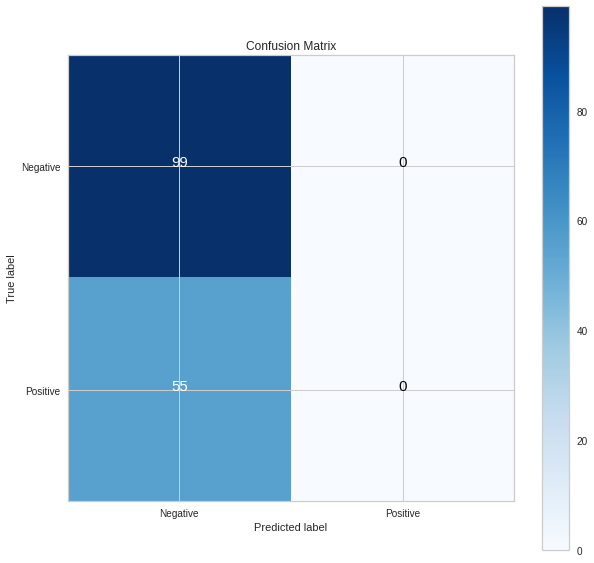

In [70]:
from sklearn.naive_bayes import BernoulliNB
model4_4=make_pipeline(
    BernoulliNB()
)
model4_4.fit(X_train,y_train)
preds4_4=model4_4.predict(X_test)
model4_4_score=accuracy_score(y_true=y_test, y_pred=preds4_4)*100
print(model4_4_score)
make_confusion_matrix(y_true=y_test, y_pred=preds4_4, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

***Model 5 Gradient Boosting Classifier***

75.32467532467533


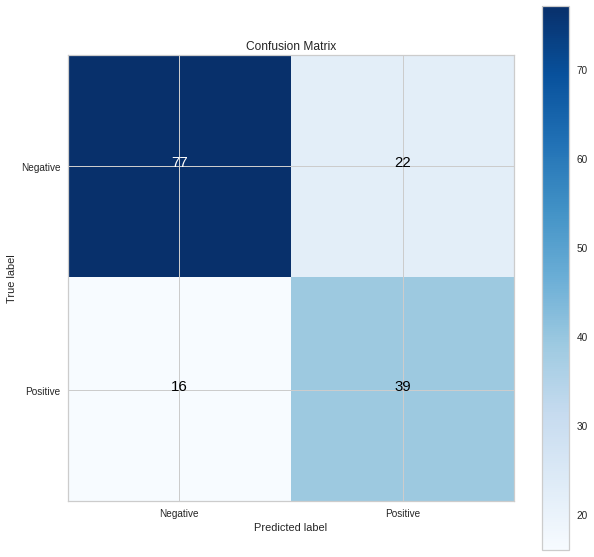

In [71]:
from sklearn.ensemble import GradientBoostingClassifier
model5=make_pipeline(
    GradientBoostingClassifier()
)
model5.fit(X_train,y_train)
preds5=model5.predict(X_test)
model5_score=accuracy_score(y_true=y_test, y_pred=preds5)*100
print(model5_score)
make_confusion_matrix(y_true=y_test, y_pred=preds5, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

***Model 6 Dense(1st)*** 

In [72]:
input_layer=tf.keras.layers.Input(shape=(8,))
hdl1=tf.keras.layers.Dense(128,activation="relu")(input_layer)
hdl2=tf.keras.layers.Dense(128,activation="relu")(hdl1)
output_layer=tf.keras.layers.Dense(1,activation="sigmoid")(hdl2)
model6=tf.keras.Model(inputs=input_layer,outputs=output_layer,name="Dense_MODEL")

In [73]:
model6.summary()

Model: "Dense_MODEL"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 8)]               0         
                                                                 
 dense (Dense)               (None, 128)               1152      
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 1)                 129       
                                                                 
Total params: 17,793
Trainable params: 17,793
Non-trainable params: 0
_________________________________________________________________


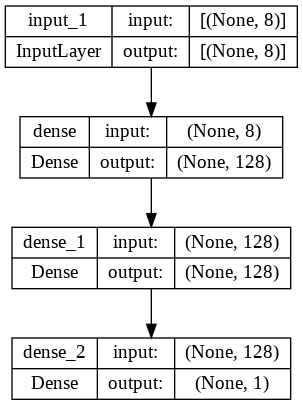

In [74]:
from keras.utils.vis_utils import plot_model
plot_model(model6, show_shapes=True, show_layer_names=True)

In [75]:
model6.compile(optimizer="adam",loss=tf.keras.losses.BinaryCrossentropy(),metrics=["accuracy"])

In [76]:
train_data=tf.data.Dataset.from_tensor_slices(X_train)
train_label=tf.data.Dataset.from_tensor_slices(y_train)
test_data=tf.data.Dataset.from_tensor_slices(X_test)
test_label=tf.data.Dataset.from_tensor_slices(y_test)



In [77]:
training_data = tf.data.Dataset.zip((train_data, train_label)).batch(32).prefetch(tf.data.AUTOTUNE )
testing_data = tf.data.Dataset.zip((test_data, test_label)).batch(32).prefetch(tf.data.AUTOTUNE )

In [78]:
#history6=model6.fit(training_data,epochs=100)

In [79]:
"""
epochs=history6.epoch
accuracy=history6.history["accuracy"]
plt.figure(figsize=(10, 8))
plt.plot(epochs,accuracy, label='accuracy')
plt.title('Training  Accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy curve')
plt.legend()

"""

'\nepochs=history6.epoch\naccuracy=history6.history["accuracy"]\nplt.figure(figsize=(10, 8))\nplt.plot(epochs,accuracy, label=\'accuracy\')\nplt.title(\'Training  Accuracy\')\nplt.xlabel(\'Epochs\')\nplt.ylabel(\'accuracy curve\')\nplt.legend()\n\n'

In [80]:
#model6.evaluate(X_test,y_test)

In [81]:
#preds6=np.round(model6.predict(X_test))

In [82]:
#preds6

In [83]:
"""
from sklearn.metrics import confusion_matrix
confusion_matrix(y_true=y_test, y_pred=preds6)

"""

'\nfrom sklearn.metrics import confusion_matrix\nconfusion_matrix(y_true=y_test, y_pred=preds6)\n\n'

In [84]:
"""
from sklearn.metrics import accuracy_score
model6_score=accuracy_score(y_true=y_test, y_pred=preds6)*100
model6_score

"""

'\nfrom sklearn.metrics import accuracy_score\nmodel6_score=accuracy_score(y_true=y_test, y_pred=preds6)*100\nmodel6_score\n\n'

In [85]:
#make_confusion_matrix(y_true=y_test, y_pred=preds6, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)

In [86]:
def loss2(history):
    loss=history.history['loss']
    val_loss=history.history['val_loss']
    accuracy=history.history['accuracy']
    val_accuracy=history.history['val_accuracy']
    epochs=history.epoch
    lr=history.history["lr"]

    plt.figure(figsize=(10, 8))
    plt.plot(lr,loss ,label='Training Loss')
    plt.plot(lr,val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('learning rate')
    plt.ylabel('losss curve')
    plt.legend()
    plt.figure(figsize=(10,10))
    plt.plot(lr,accuracy, label='accuracy')
    plt.plot(lr,val_accuracy, label='val_accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('learning rate')
    plt.ylabel('accuracy curve')
    plt.legend()

***Mdoel 7 Dense***

In [87]:
input_layer=tf.keras.layers.Input(shape=(8))
hdl1=tf.keras.layers.Dense(364,activation="relu")(input_layer)
dropout_layer1=tf.keras.layers.Dropout(0.2)(hdl1)
hdl2=tf.keras.layers.Dense(364,activation="relu")(dropout_layer1)
dropout_layer2=tf.keras.layers.Dropout(0.2)(hdl2)
hdl3=tf.keras.layers.Dense(364,activation="relu")(dropout_layer2)
dropout_layer3=tf.keras.layers.Dropout(0.2)(hdl3)
hdl4=tf.keras.layers.Dense(364,activation="relu")(dropout_layer3)
output_layer=tf.keras.layers.Dense(1,activation="sigmoid")(hdl4)
#output_layer=tf.keras.layers.Dense(1,activation="sigmoid")(hdl1)
model7=tf.keras.Model(inputs=input_layer,outputs=output_layer,name="modified_dense")

In [88]:
model7.summary()

Model: "modified_dense"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 8)]               0         
                                                                 
 dense_3 (Dense)             (None, 364)               3276      
                                                                 
 dropout (Dropout)           (None, 364)               0         
                                                                 
 dense_4 (Dense)             (None, 364)               132860    
                                                                 
 dropout_1 (Dropout)         (None, 364)               0         
                                                                 
 dense_5 (Dense)             (None, 364)               132860    
                                                                 
 dropout_2 (Dropout)         (None, 364)            

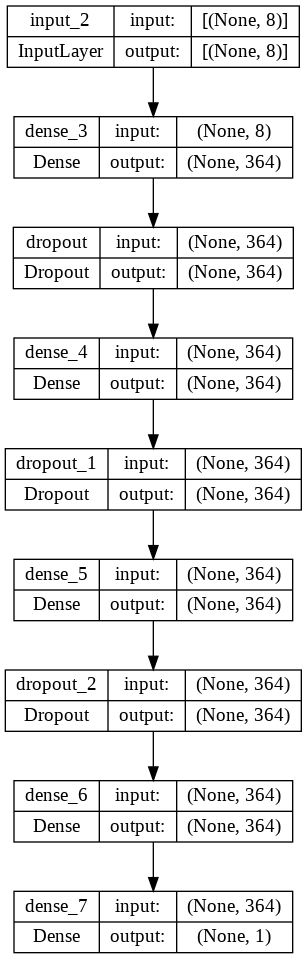

In [89]:
from keras.utils.vis_utils import plot_model
plot_model(model7,show_shapes=True, show_layer_names=True)

In [90]:
model7.compile(loss=tf.keras.losses.BinaryCrossentropy(),optimizer=tf.keras.optimizers.Adam(lr=0.01),metrics=["accuracy"])

In [91]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
60,2,84.0,72,20.536458,79.799479,32.0,0.304,21
618,9,112.0,82,24.000000,79.799479,28.2,1.282,50
346,1,139.0,46,19.000000,83.000000,28.7,0.654,22
294,0,161.0,50,20.536458,79.799479,21.9,0.254,65
231,6,134.0,80,37.000000,370.000000,46.2,0.238,46
...,...,...,...,...,...,...,...,...
71,5,139.0,64,35.000000,140.000000,28.6,0.411,26
106,1,96.0,122,20.536458,79.799479,22.4,0.207,27
270,10,101.0,86,37.000000,79.799479,45.6,1.136,38
435,0,141.0,72,20.536458,79.799479,42.4,0.205,29


In [92]:
#from sklearn.preprocessing import OneHotEncoder
#one_hot_encoder = OneHotEncoder(handle_unknown='ignore')
X_train_one_hot=tf.one_hot(X_train,depth=10)
#y_train_one_hot=one_hot_encoder.fit_transform(y_train)
X_test_one_hot=tf.one_hot(X_test,depth=10)
#y_train_one_hot=one_hot_encoder.fit_transform(y_train)


In [93]:
np.percentile(X_train["Pregnancies"],99)

13.0

In [94]:
X_train_one_hot,X_test_one_hot

(<tf.Tensor: shape=(614, 8, 10), dtype=float32, numpy=
 array([[[0., 0., 1., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [1., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 1.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 1., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 1., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [1., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        ...,
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ...

In [95]:
from sklearn import preprocessing
normalizer = preprocessing.Normalizer().fit(X_train)  
X_train_7_normalize = normalizer.transform(X_train)
X_test_7_normalize = normalizer.transform(X_test)

In [96]:
X_train_7_normalize

array([[0.01396902, 0.58669869, 0.50288459, ..., 0.22350426, 0.00212329,
        0.14667467],
       [0.05232042, 0.65109852, 0.47669713, ..., 0.16393731, 0.00745275,
        0.29066898],
       [0.00577388, 0.80256881, 0.26559831, ..., 0.16571025, 0.00377612,
        0.12702528],
       ...,
       [0.05876397, 0.59351615, 0.50537018, ..., 0.26796372, 0.00667559,
        0.2233031 ],
       [0.        , 0.75918995, 0.38767146, ..., 0.22829542, 0.00110379,
        0.15614545],
       [0.        , 0.69254446, 0.53187415, ..., 0.124658  , 0.00145157,
        0.11634747]])

In [97]:
X_test_7_normalize

array([[0.02601374, 0.42489113, 0.25146618, ..., 0.14741121, 0.00186432,
        0.18643182],
       [0.01210888, 0.67809745, 0.45408311, ..., 0.21614356, 0.00089606,
        0.12714327],
       [0.0129252 , 0.69796097, 0.4136065 , ..., 0.19904813, 0.00102109,
        0.13571463],
       ...,
       [0.0499355 , 0.59298404, 0.44941948, ..., 0.22970329, 0.00302734,
        0.35579042],
       [0.00501745, 0.36627374, 0.1756107 , ..., 0.07024428, 0.00084544,
        0.072753  ],
       [0.06098421, 0.56410391, 0.53361181, ..., 0.26909281, 0.00537423,
        0.29729801]])

In [98]:
X_train.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [99]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler
minmax = make_column_transformer((
    MinMaxScaler(), ["Pregnancies", "Glucose", "BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"] # get all values between 0 and 1
    
))
minmax.fit(X_train)


ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('minmaxscaler',
                                 MinMaxScaler(clip=False, copy=True,
                                              feature_range=(0, 1)),
                                 ['Pregnancies', 'Glucose', 'BloodPressure',
                                  'SkinThickness', 'Insulin', 'BMI',
                                  'DiabetesPedigreeFunction', 'Age'])],
                  verbose=False, verbose_feature_names_out=True)

In [100]:
X_train_7_minmax = minmax.transform(X_train)
X_test_7_minmax = minmax.transform(X_test)

In [101]:
X_train_7_minmax

array([[0.11764706, 0.25806452, 0.48979592, ..., 0.28220859, 0.09649872,
        0.        ],
       [0.52941176, 0.43870968, 0.59183673, ..., 0.20449898, 0.51409052,
        0.48333333],
       [0.05882353, 0.61290323, 0.2244898 , ..., 0.21472393, 0.24594364,
        0.01666667],
       ...,
       [0.58823529, 0.36774194, 0.63265306, ..., 0.5603272 , 0.45175064,
        0.28333333],
       [0.        , 0.62580645, 0.48979592, ..., 0.49488753, 0.05422716,
        0.13333333],
       [0.        , 0.52258065, 0.73469388, ..., 0.08793456, 0.07856533,
        0.        ]])

In [102]:
X_test_7_minmax

array([[0.35294118, 0.3483871 , 0.34693878, ..., 0.32310838, 0.15029889,
        0.36666667],
       [0.11764706, 0.43870968, 0.52040816, ..., 0.35787321, 0.02988898,
        0.        ],
       [0.11764706, 0.41290323, 0.40816327, ..., 0.25766871, 0.03415884,
        0.        ],
       ...,
       [0.47058824, 0.32903226, 0.48979592, ..., 0.3803681 , 0.17378309,
        0.6       ],
       [0.11764706, 0.65806452, 0.46938776, ..., 0.200409  , 0.11058924,
        0.13333333],
       [0.47058824, 0.19354839, 0.46938776, ..., 0.34969325, 0.2677199 ,
        0.3       ]])

In [103]:
train_data_7=tf.data.Dataset.from_tensor_slices(X_train_7_minmax)
train_label_7=tf.data.Dataset.from_tensor_slices(y_train)
test_data_7=tf.data.Dataset.from_tensor_slices(X_test_7_minmax)
test_label_7=tf.data.Dataset.from_tensor_slices(y_test)
training_data_7 = tf.data.Dataset.zip((train_data_7, train_label_7)).batch(32).prefetch(tf.data.AUTOTUNE )
testing_data_7 = tf.data.Dataset.zip((test_data_7, test_label_7)).batch(32).prefetch(tf.data.AUTOTUNE )


In [113]:
history7=model7.fit(training_data_7,epochs=200,validation_data=testing_data_7 ,callbacks=[create_model_checkpoint(model_name=model7.name)

                                                                                          #,tf.keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                                                                           #patience=10,
                                                                                                                           #restore_best_weights=True),
                                                                                          #tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
                                                                                                                               #patience=10,
                                                                                                                              # verbose=1)
                                                                                                                              ]
                                                                                          )

Epoch 1/200
20/20 [==============================] - 1s 52ms/step - loss: 0.3768 - accuracy: 0.8257 - val_loss: 0.6493 - val_accuracy: 0.7468
Epoch 2/200
20/20 [==============================] - 1s 52ms/step - loss: 0.3902 - accuracy: 0.8094 - val_loss: 0.5788 - val_accuracy: 0.7532
Epoch 3/200
20/20 [==============================] - 0s 4ms/step - loss: 0.3951 - accuracy: 0.8062 - val_loss: 0.7161 - val_accuracy: 0.7792
Epoch 4/200
20/20 [==============================] - 1s 57ms/step - loss: 0.3893 - accuracy: 0.8241 - val_loss: 0.5450 - val_accuracy: 0.7468
Epoch 5/200
20/20 [==============================] - 0s 5ms/step - loss: 0.3971 - accuracy: 0.8176 - val_loss: 0.5787 - val_accuracy: 0.7468
Epoch 6/200
20/20 [==============================] - 0s 5ms/step - loss: 0.3876 - accuracy: 0.8176 - val_loss: 0.5880 - val_accuracy: 0.7403
Epoch 7/200
20/20 [==============================] - 0s 4ms/step - loss: 0.3808 - accuracy: 0.8404 - val_loss: 0.6325 - val_accuracy: 0.7403
Epoch 8/20

In [114]:
model7.evaluate(testing_data_7)

5/5 [==============================] - 0s 3ms/step - loss: 0.5580 - accuracy: 0.7143


[0.5579785704612732, 0.7142857313156128]

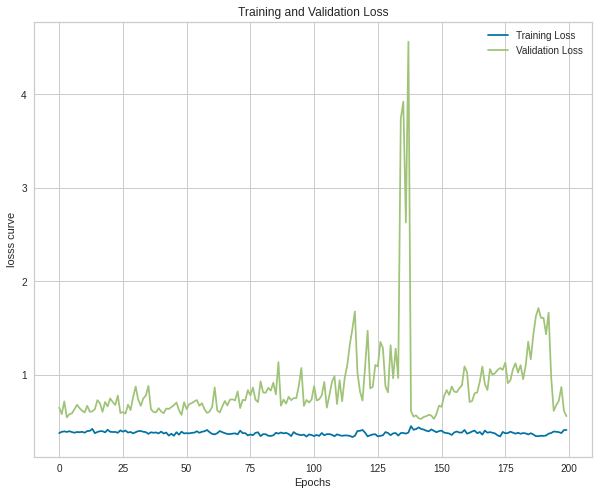

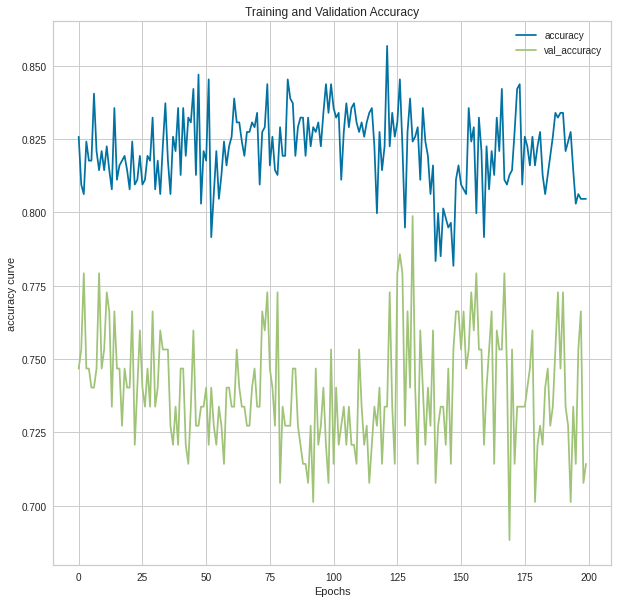

In [115]:
loss(history7)

In [116]:
model = tf.keras.models.load_model("/content/model_experiments/modified_dense")

In [117]:
model.evaluate(testing_data_7)

5/5 [==============================] - 0s 3ms/step - loss: 0.5283 - accuracy: 0.7338


[0.5283375382423401, 0.7337662577629089]

In [118]:
preds7=np.round(model.predict(X_test_7_minmax))

5/5 [==============================] - 0s 2ms/step


In [119]:
preds7

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],

In [120]:
model7_score=accuracy_score(y_true=y_test, y_pred=preds7)*100
model7_score

73.37662337662337

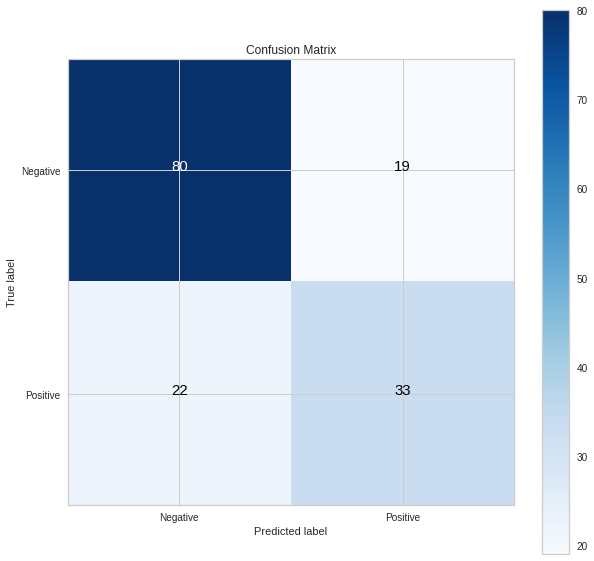

In [121]:
make_confusion_matrix(y_true=y_test, y_pred=preds7, classes=["Negative","Positive"], figsize=(10, 10), text_size=15, norm=False, savefig=False)